In [1]:
!pip install hdbscan

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from load_logs import *
from evaluation import *
from features import *
from visualize import *

In [4]:
from sklearn.metrics.pairwise import pairwise_distances

In [5]:
logs, log_labels = read_logs_and_labels("./Saved/logs.txt", "./Saved/labels.txt")

In [6]:
import matplotlib.pyplot as plt
import numpy as np

import hdbscan
from sklearn import metrics

In [7]:
# algorithms = ["auto", "ball_tree", "kd_tree", "brute"] 
# leaf_size = [10, 20, 30, 40, 50] 
eps = [0.4, 0.5, 0.6, 0.7, 0.8] #cluster_selection_epsilon parameter for hdbscan
metrics = ["precomputed", "euclidean","manhattan"]
min_samples =  [100, 200, 300, 400, 500] #is it worth it to use the min_sample from DBSCAN and cache using memory?
min_cluster_size = [100, 200, 300, 400, 500]
#cluster_selection_methods=["eom", "leaf"]

In [8]:
def grid_search(logs, gram, min_df):
    
    labels_ = log_labels
            
    X = get_features(logs, gram, min_df)
    X = X.toarray()

    idxs = np.where(np.all(X == 0, axis=1))

    X = np.delete(X, idxs, axis=0)
    labels_ = np.delete(labels_, idxs)

    result_header = ["Eps", "Min Cluster Size", "Min Sample Size", "Metric", "VMeasure", "Fowlkes-Mallows", "Labels"]
    results = []
    
    Y = pairwise_distances(X, metric="cosine")
    
    #using min sample = 100 based off of dbscan results
    
    for metric in metrics:
        for min_cl in min_cluster_size:
            for min_s in min_samples:
                for ep in eps:
                        model = hdbscan.HDBSCAN(min_cluster_size=min_cl,min_samples=min_s,cluster_selection_epsilon=0.5,
                                                metric=metric,algorithm='best')

                        if metric == "precomputed":
                            model.fit(Y)
                        else :
                            model.fit(X)

                        labels = model.labels_

                        vm = evaluate_vmeasure(labels_, labels)
                        fm = evaluate_fm(labels_, labels)

                        lst1 = set(labels)

                        result = [0.5, min_cl, min_s, metric, vm, fm, len(lst1)-1]
                        results.append(result)

                        tab_results(result_header, results) 

                
    tab_results(result_header, results)         

In [9]:
grid_search(logs, 2, 70)

+-----+------------------+-----------------+-------------+--------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |      VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+--------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed | 0.3073031922661106 | 0.6510868453618832 |   4    |
+-----+------------------+-----------------+-------------+--------------------+--------------------+--------+
+-----+------------------+-----------------+-------------+--------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |      VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+--------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed | 0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |   

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106 | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803 | 0.6099328198618424 |   5    |
|

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  | 0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  | 0.6099328198618424 |  

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure       |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+----------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       100       | precomputed |  0.3073031922661106  |  0.6510868453618832 |   4    |
| 0.5 |       100        |       200       | precomputed | 0.23923961775963803  |  0.60993281986

In [10]:
grid_search(logs, 3, 90)

+-----+------------------+-----------------+-------------+-------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |      VMeasure     |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+-------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed | 0.288086960599321 | 0.4425891176346364 |   8    |
+-----+------------------+-----------------+-------------+-------------------+--------------------+--------+
+-----+------------------+-----------------+-------------+-------------------+--------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |      VMeasure     |  Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+-------------------+--------------------+--------+
| 0.5 |       100        |       100       | precomputed | 0.288086960599321 | 0.4425891176346364 |   8    |
| 0.5 |       100  

+-----+------------------+-----------------+-------------+--------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |      VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+--------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed | 0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed | 0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed | 0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed | 0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed | 0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed | 0.2335355956440677 | 0.39316263449652716 |   9    |
|

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| Eps | Min Cluster Size | Min Sample Size |    Metric   |       VMeasure      |   Fowlkes-Mallows   | Labels |
+-----+------------------+-----------------+-------------+---------------------+---------------------+--------+
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       100       | precomputed |  0.288086960599321  |  0.4425891176346364 |   8    |
| 0.5 |       100        |       200       | precomputed |  0.2335355956440677 | 0.39316263449652716 |  

## Bigram Feature Vectorizer

In [11]:
eval_results = []

In [12]:
labels_ = log_labels

X = get_features(logs, 2, 70)
X = X.toarray()

idxs = np.where(np.all(X == 0, axis=1))

X = np.delete(X, idxs, axis=0)
labels_ = np.delete(labels_, idxs)

In [13]:
model = hdbscan.HDBSCAN(min_cluster_size=500,min_samples=100,cluster_selection_epsilon=0.5,
                                        metric="euclidean",algorithm='best')
model.fit(X)

HDBSCAN(cluster_selection_epsilon=0.5, min_cluster_size=500, min_samples=100)

In [14]:
labels = model.labels_

In [15]:
lst1 = set(labels)
lst1

{-1, 0, 1, 2, 3}

C:\Users\Riley\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\umap\spectral.py:255: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


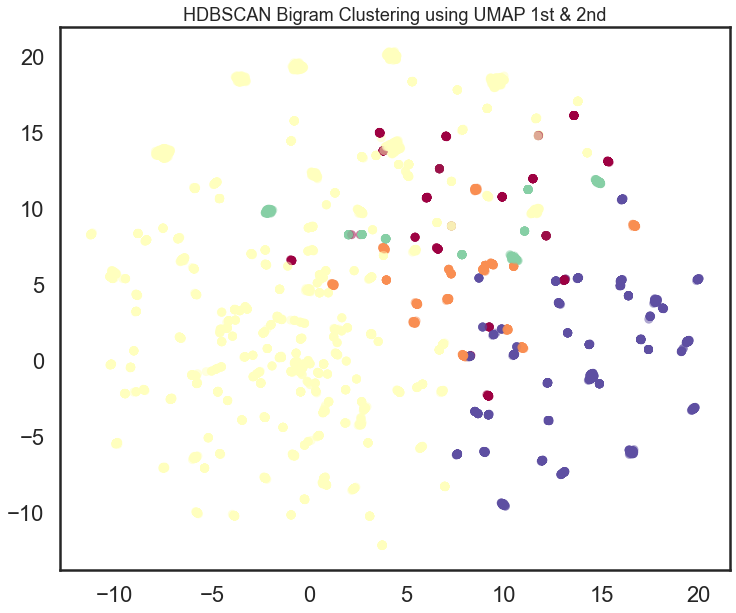

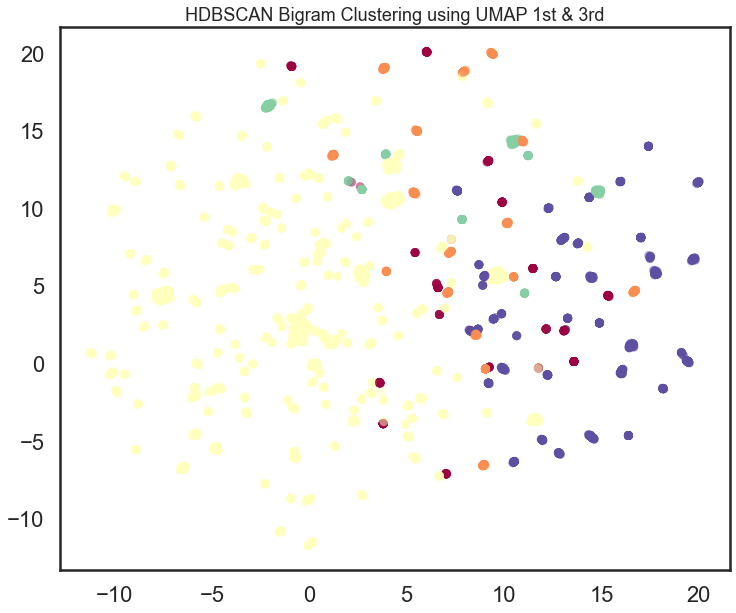

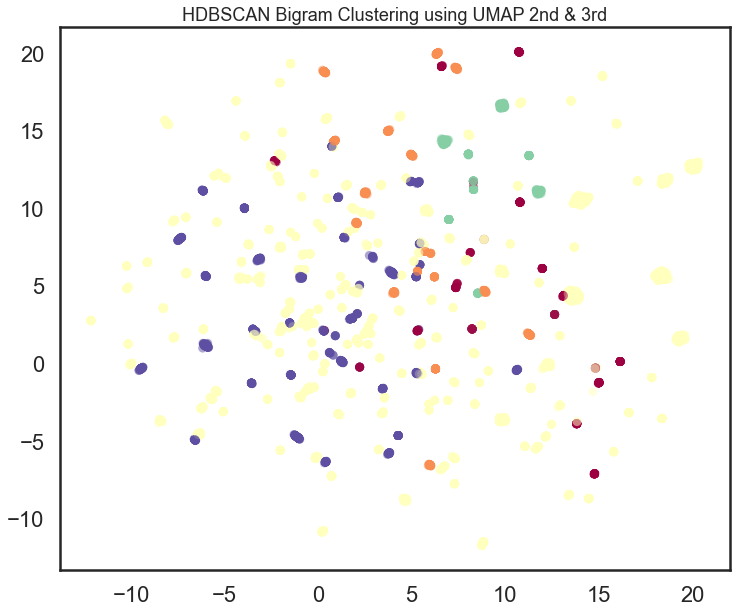

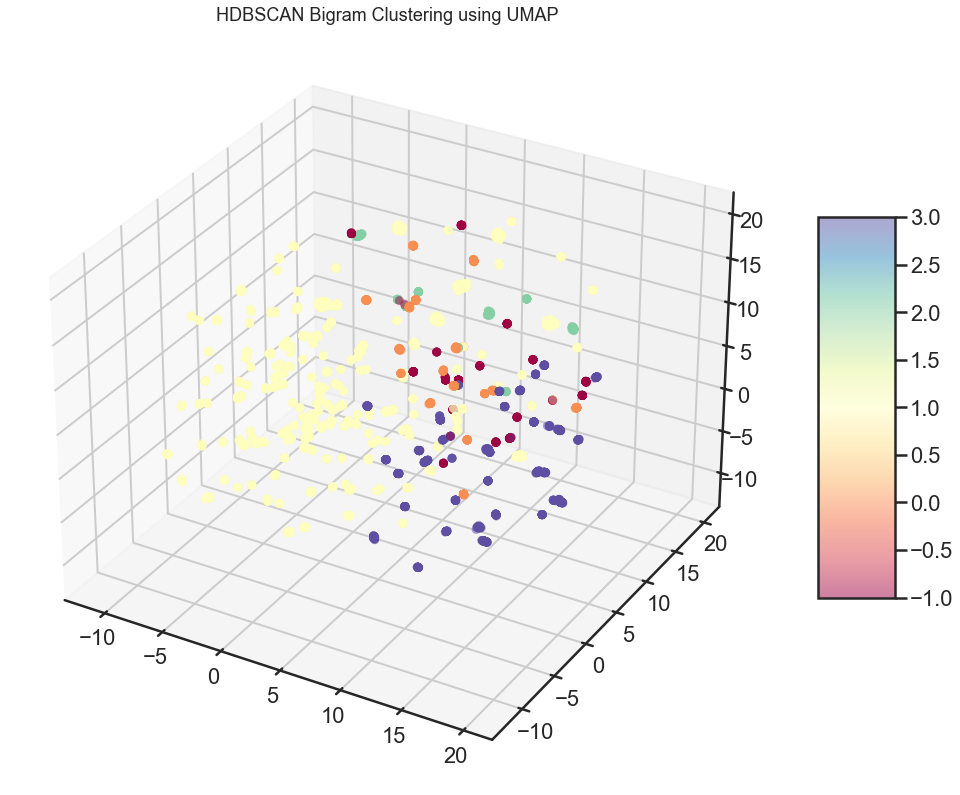

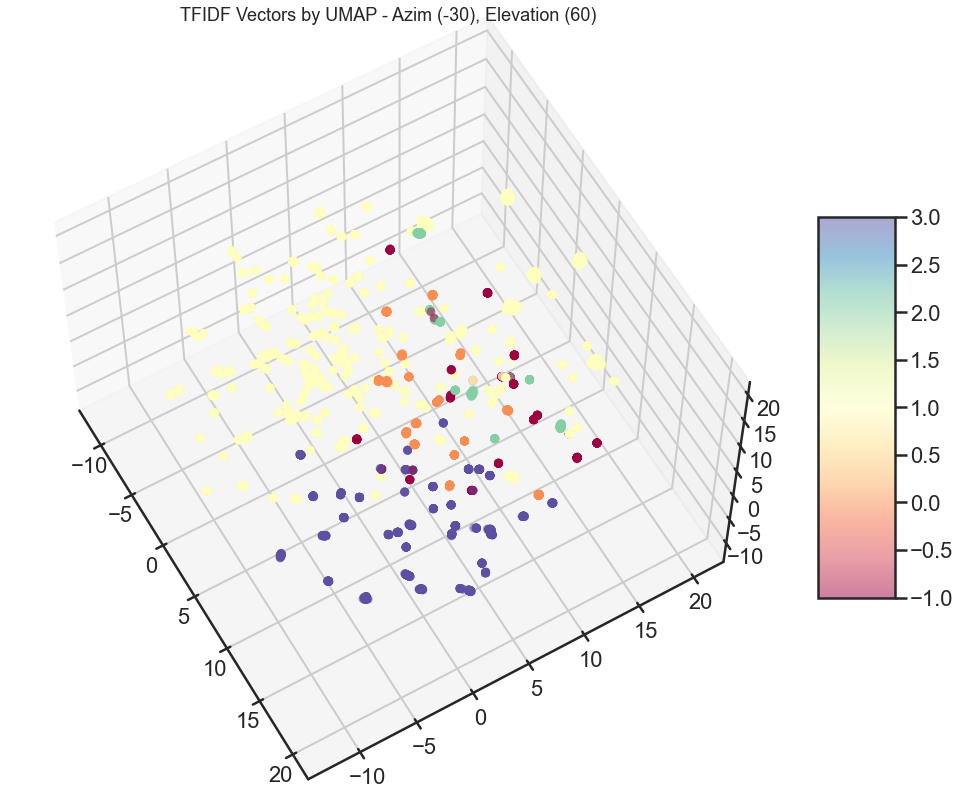

In [16]:
plot_clusters("HDBSCAN Bigram Clustering using UMAP", X, labels)

In [17]:
results = evaluate_clustering('HDBSCAN Bigram Clustering', X, labels_, labels)
print(results)

['HDBSCAN Bigram Clustering', '0.43', '0.24', '0.31', '0.25', '0.31', '0.65']


In [18]:
eval_results.append(results)

## Trigram Feature Vectorizer

In [19]:
labels_ = log_labels

In [20]:
X = get_features(logs, 3, 90)
X = X.toarray()

idxs = np.where(np.all(X == 0, axis=1))

X = np.delete(X, idxs, axis=0)
labels_ = np.delete(labels_, idxs)

In [21]:
 Y = pairwise_distances(X, metric="cosine")

In [22]:
model = hdbscan.HDBSCAN(min_cluster_size=500,min_samples=100,cluster_selection_epsilon=0.5,
                                        metric="precomputed",algorithm='best')
model.fit(Y)

HDBSCAN(cluster_selection_epsilon=0.5, metric='precomputed',
        min_cluster_size=500, min_samples=100)

In [23]:
labels = model.labels_

In [24]:
lst1 = set(labels)
lst1

{-1, 0, 1, 2, 3, 4}

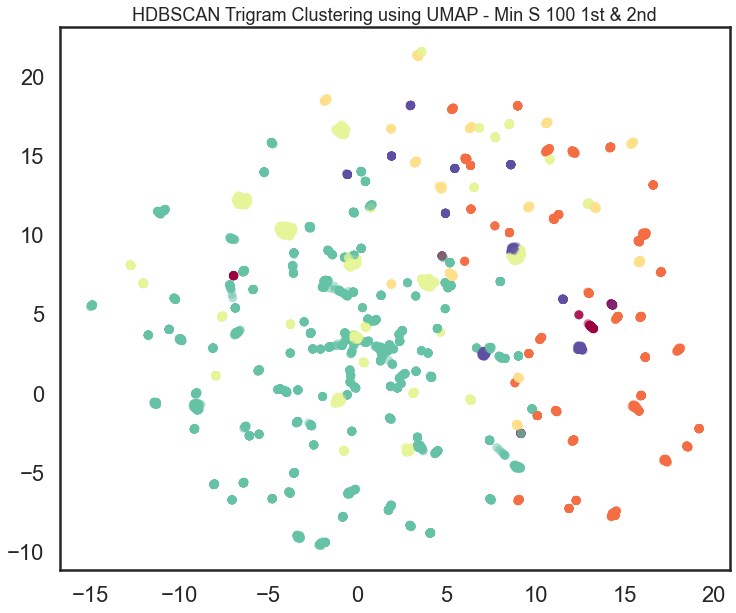

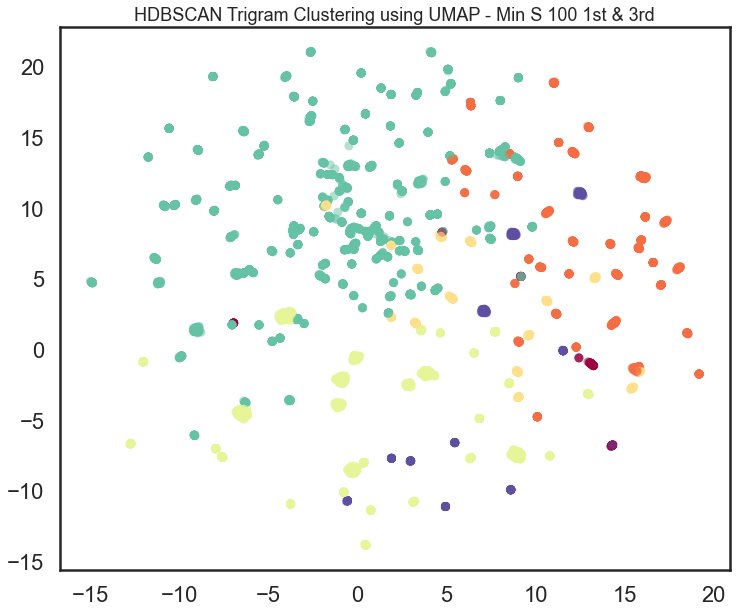

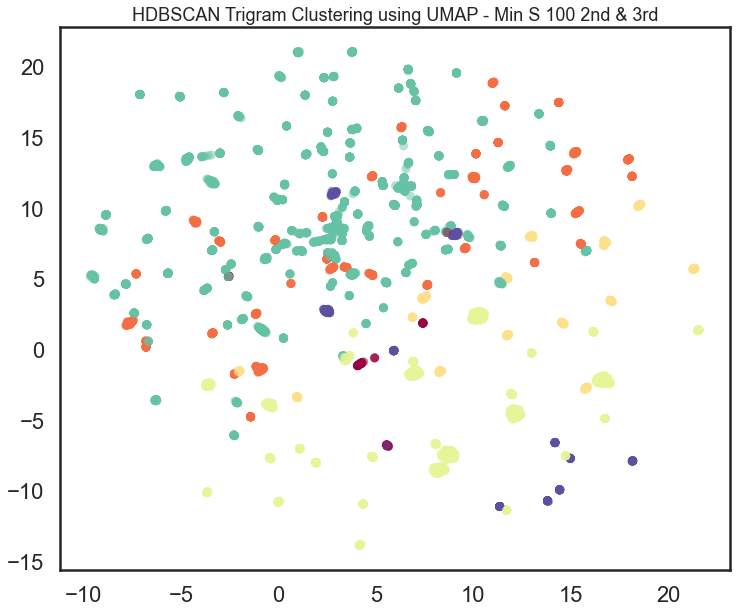

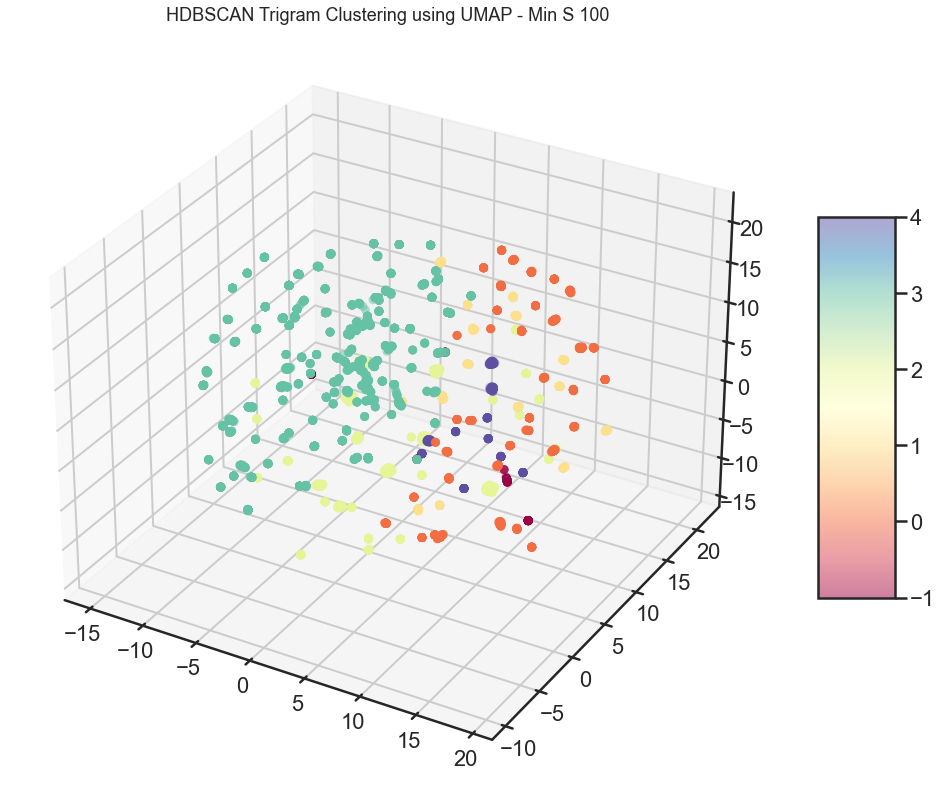

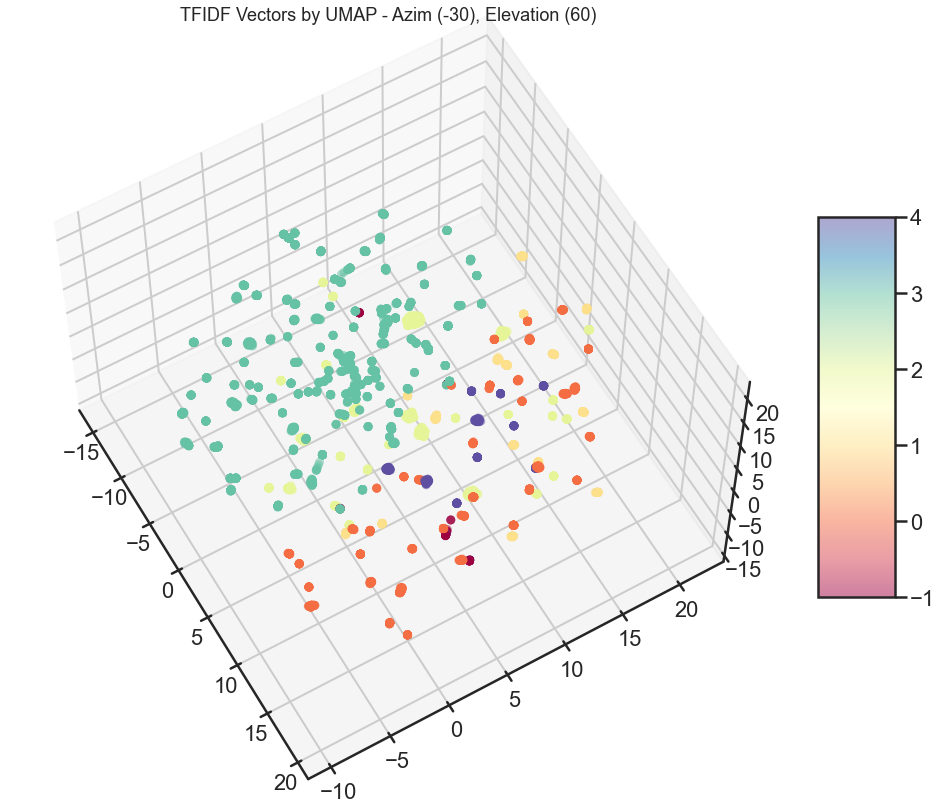

In [25]:
plot_clusters("HDBSCAN Trigram Clustering using UMAP - Min S 100", X, labels)

In [26]:
results = evaluate_clustering('HDBSCAN Trigram Clustering - Min S 100', X, labels_, labels)
print(results)

['HDBSCAN Trigram Clustering - Min S 100', '0.57', '0.23', '0.33', '0.16', '0.33', '0.51']


In [27]:
eval_results.append(results)

<AxesSubplot:ylabel='distance'>

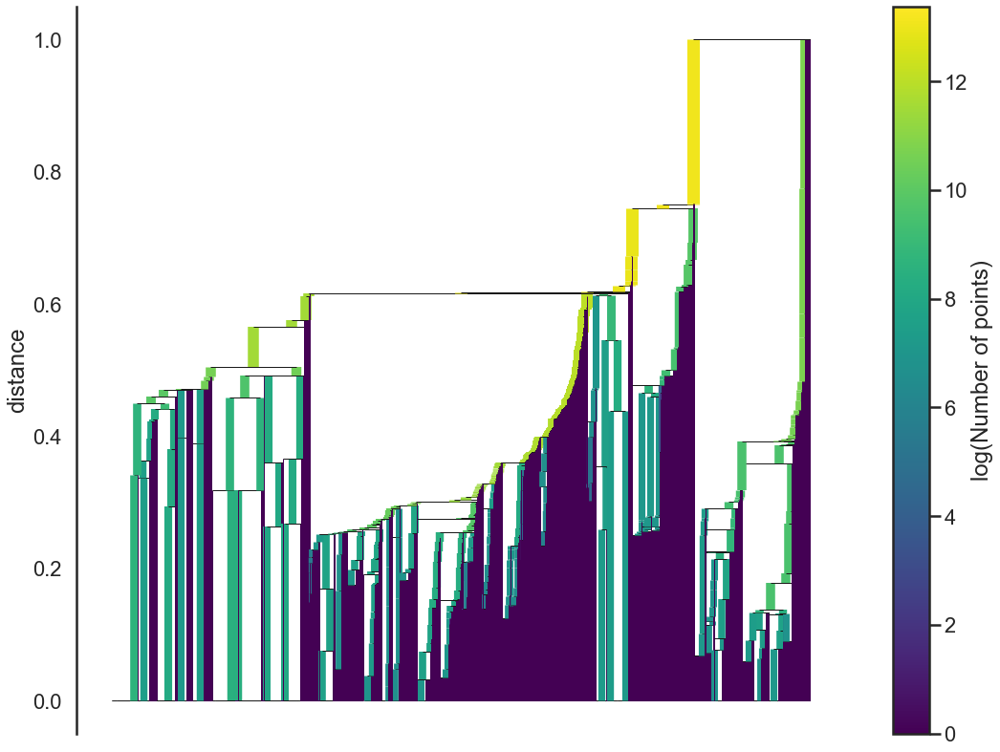

In [28]:
model.single_linkage_tree_.plot(cmap='viridis', colorbar=True)

<AxesSubplot:ylabel='$\\lambda$ value'>

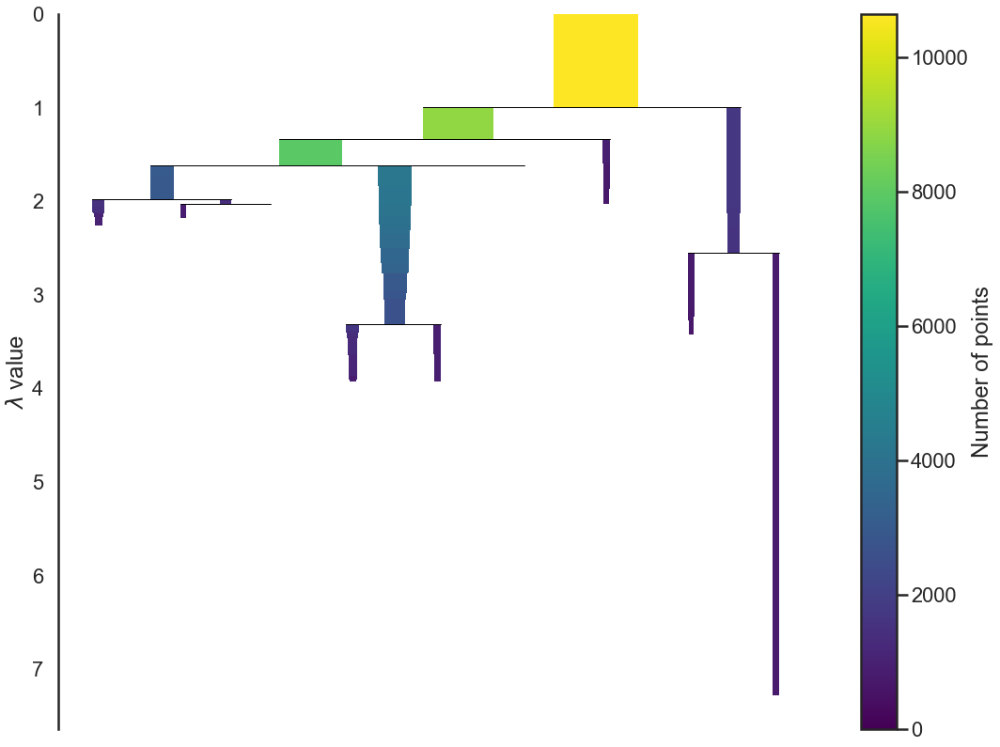

In [29]:
model.condensed_tree_.plot()